<a href="https://colab.research.google.com/github/zahrasiddiqa/Cryptocurrency-prediction-with-ML-algorithms/blob/main/Cryptocurrency-prediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Prediction of Cryptocurrencies using Machine Learning

#Libraries

In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
warnings.filterwarnings("ignore")

import itertools
import pandas as pd
import numpy as np 


from pandas import DataFrame

import matplotlib.pyplot as plt 
import matplotlib.dates as mdates
import matplotlib.ticker as mticker
from matplotlib.pylab import rcParams

import datetime  

# https://matplotlib.org/users/customizing.html
rcParams['figure.figsize'] = 15, 8
plt.style.use('ggplot')

import requests
import json
from sklearn.model_selection import train_test_split
import statsmodels.api as smapi


In [3]:
# from mplfinance.original_flavor import candlestick_ohlc
! pip install mpl_finance

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [4]:
from mpl_finance import candlestick_ohlc
import seaborn as sns

from sklearn.metrics import mean_squared_error
import seaborn as sns
color = sns.color_palette()
%matplotlib inline

pd.options.mode.chained_assignment = None
pd.options.display.max_columns = 999

In [90]:
from keras.models import Sequential 
from keras.layers import Dense 
from keras.layers import LSTM 
from sklearn.preprocessing import MinMaxScaler 
from sklearn.preprocessing import LabelEncoder 
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf

from matplotlib import pyplot

In [6]:
def configure_plotly_browser_state():
  import IPython
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-latest.min.js?noext',
            },
          });
        </script>
        '''))

In [7]:
import plotly.offline as py 
import plotly.graph_objs as go 
from plotly import tools
py.init_notebook_mode(connected=True)
import IPython
IPython.get_ipython().events.register('pre_run_cell', configure_plotly_browser_state)

# Data Processing

In [8]:
# Downloading data from Kaggle
! pip install -q kaggle

In [21]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"zahra94","key":"fb55af796286783efbb9d2be1b83c8d5"}'}

In [22]:
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json
# ! kaggle datasets list

mkdir: cannot create directory ‘/root/.kaggle’: File exists


In [23]:
!kaggle datasets download -d sudalairajkumar/cryptocurrencypricehistory

cryptocurrencypricehistory.zip: Skipping, found more recently modified local copy (use --force to force download)


In [24]:
! unzip /content/cryptocurrencypricehistory.zip -d /content/

Archive:  /content/cryptocurrencypricehistory.zip
  inflating: /content/coin_Aave.csv  
  inflating: /content/coin_BinanceCoin.csv  
  inflating: /content/coin_Bitcoin.csv  
  inflating: /content/coin_Cardano.csv  
  inflating: /content/coin_ChainLink.csv  
  inflating: /content/coin_Cosmos.csv  
  inflating: /content/coin_CryptocomCoin.csv  
  inflating: /content/coin_Dogecoin.csv  
  inflating: /content/coin_EOS.csv   
  inflating: /content/coin_Ethereum.csv  
  inflating: /content/coin_Iota.csv  
  inflating: /content/coin_Litecoin.csv  
  inflating: /content/coin_Monero.csv  
  inflating: /content/coin_NEM.csv   
  inflating: /content/coin_Polkadot.csv  
  inflating: /content/coin_Solana.csv  
  inflating: /content/coin_Stellar.csv  
  inflating: /content/coin_Tether.csv  
  inflating: /content/coin_Tron.csv  
  inflating: /content/coin_USDCoin.csv  
  inflating: /content/coin_Uniswap.csv  
  inflating: /content/coin_WrappedBitcoin.csv  
  inflating: /content/coin_XRP.csv   


In [41]:
# Reading CSV files 

crypto_data = {}

crypto_data['bitcoin_price'] = pd.read_csv('/content/bitcoin_price.csv', parse_dates=['Date'])
crypto_data['ethereum_price'] = pd.read_csv('/content/coin_Ethereum.csv', parse_dates=['Date'])
# crypto_data['iota_price'] = pd.read_csv('/content/iota_price.csv', parse_dates=['Date'])
# crypto_data['litecoin_price'] = pd.read_csv('/content/litecoin_price.csv', parse_dates=['Date'])
# crypto_data['monero_price'] = pd.read_csv('/content/monero_price.csv', parse_dates=['Date'])
# crypto_data['nem_price'] = pd.read_csv('/content/nem_price.csv', parse_dates=['Date'])
# crypto_data['neo_price'] = pd.read_csv('/content/neo_price.csv', parse_dates=['Date'])
# crypto_data['numeraire_price'] = pd.read_csv('/content/numeraire_price.csv', parse_dates=['Date'])
# crypto_data['omisego_price'] = pd.read_csv('/content/omisego_price.csv', parse_dates=['Date'])
# crypto_data['qtum_price'] = pd.read_csv('/content/qtum_price.csv', parse_dates=['Date'])
# crypto_data['ripple_price'] = pd.read_csv('/content/ripple_price.csv', parse_dates=['Date'])
# crypto_data['stratis_price'] = pd.read_csv('/content/stratis_price.csv', parse_dates=['Date'])
# crypto_data['waves_price'] = pd.read_csv('/content/waves_price.csv', parse_dates=['Date'])
# crypto_data['dash_price'] = pd.read_csv('/content/dash_price.csv', parse_dates=['Date'])
crypto_data['bitcoin_price1'] = pd.read_csv('/content/bitcoin_price1.csv', parse_dates=['Date'])

In [42]:
# changing datatype to float from string
crypto_data['bitcoin_price1'].replace(',','', regex=True, inplace=True)
c = crypto_data['bitcoin_price1'].select_dtypes(object).columns
crypto_data['bitcoin_price1'][c] = crypto_data['bitcoin_price1'][c].apply(pd.to_numeric,errors='coerce')

crypto_data['bitcoin_price'].replace(',','', regex=True, inplace=True)
c = crypto_data['bitcoin_price'].select_dtypes(object).columns
crypto_data['bitcoin_price'][c] = crypto_data['bitcoin_price1'][c].apply(pd.to_numeric,errors='coerce')

In [45]:
print(crypto_data['bitcoin_price'].describe())
print(crypto_data['bitcoin_price'].head(10))
print(crypto_data['bitcoin_price'].dtypes)

               Open          High           Low         Close        Volume  \
count   1760.000000   1760.000000   1760.000000   1760.000000  1.012000e+03   
mean    1479.574239   1536.991108   1418.251273   1485.747000  1.830855e+10   
std     2950.457188   3092.950362   2780.859459   2959.265478  1.357269e+10   
min       68.500000     74.560000     65.530000     68.430000  2.923670e+09   
25%      274.730000    279.857500    268.640000    274.875000  5.749878e+09   
50%      480.715000    495.195000    472.510000    482.810000  1.630156e+10   
75%      870.085000    900.222500    831.682500    871.370000  2.608528e+10   
max    19475.800000  20089.000000  18974.100000  19497.400000  7.415677e+10   

         Market Cap  
count  1.012000e+03  
mean   1.453327e+11  
std    5.153738e+10  
min    5.640069e+10  
25%    1.122988e+11  
50%    1.433919e+11  
75%    1.760048e+11  
max    3.545044e+11  
        Date      Open      High       Low     Close        Volume  \
0 2018-02-20  11231.

In [46]:
print(crypto_data['bitcoin_price1'].describe())
print(crypto_data['bitcoin_price1'].head(10))
print(crypto_data['bitcoin_price1'].dtypes)

               Open          High           Low         Close        Volume  \
count   1012.000000   1012.000000   1012.000000   1012.000000  1.012000e+03   
mean    8119.617569   8288.664526   7944.057875   8126.051403  1.830855e+10   
std     2723.311156   2792.323902   2654.261116   2738.524039  1.357269e+10   
min     3236.270000   3275.380000   3191.300000   3236.760000  2.923670e+09   
25%     6468.142500   6550.905000   6363.102500   6469.117500  5.749878e+09   
50%     8143.240000   8262.300000   7919.465000   8145.025000  1.630156e+10   
75%     9700.152500   9908.825000   9530.607500   9700.497500  2.608528e+10   
max    19104.410000  19390.970000  18581.150000  19107.460000  7.415677e+10   

         Market Cap  
count  1.012000e+03  
mean   1.453327e+11  
std    5.153738e+10  
min    5.640069e+10  
25%    1.122988e+11  
50%    1.433919e+11  
75%    1.760048e+11  
max    3.545044e+11  
        Date      Open      High       Low     Close       Volume  \
0 2020-11-28  17112.9

In [37]:
print(list(crypto_data['bitcoin_price'].columns.values) )
print(list(crypto_data['bitcoin_price1'].columns.values) )

['SNo', 'Name', 'Symbol', 'Date', 'High', 'Low', 'Open', 'Close', 'Volume', 'Marketcap']
['SNo', 'Name', 'Symbol', 'Date', 'High', 'Low', 'Open', 'Close', 'Volume', 'Marketcap']


In [47]:
# Merging with latest data
import os, glob
import pandas as pd

path = "/content/"
all_files = glob.glob(os.path.join(path, "bitcoin_price*.csv"))
df_merged = (pd.read_csv(f, sep=',') for f in all_files)
df_from_each_file = (pd.read_csv(f, sep=',') for f in all_files)
df_merged   = pd.concat(df_from_each_file, ignore_index=True)
df_merged.to_csv( "bitcoin_price_full.csv")

In [48]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [49]:
crypto_data['bitcoin_price'] = pd.read_csv('/content/bitcoin_price_full.csv', parse_dates=['Date'])
# , index_col=0

In [50]:
# Showing merged data
print(crypto_data['bitcoin_price'].head(10))
print(crypto_data['bitcoin_price'].tail(10))

   Unnamed: 0       Date       Open       High        Low      Close  \
0           0 2020-11-28  17,112.93  17,853.94  16,910.65  17,717.42   
1           1 2020-11-27  17,153.91  17,445.02  16,526.42  17,108.40   
2           2 2020-11-26  18,729.84  18,866.29  16,351.03  17,150.62   
3           3 2020-11-25  19,104.41  19,390.97  18,581.15  18,732.12   
4           4 2020-11-24  18,365.01  19,348.27  18,128.66  19,107.46   
5           5 2020-11-23  18,370.02  18,711.43  18,000.80  18,364.12   
6           6 2020-11-22  18,642.23  18,688.97  17,671.38  18,370.00   
7           7 2020-11-21  18,621.32  18,936.62  18,444.36  18,642.23   
8           8 2020-11-20  17,817.08  18,773.23  17,765.80  18,621.31   
9           9 2020-11-19  17,803.86  18,119.55  17,382.55  17,817.09   

           Volume       Market Cap  
0  32,601,040,734  328,782,832,212  
1  38,886,494,645  317,464,460,530  
2  61,396,835,737  318,231,964,319  
3  43,710,357,371  347,558,803,507  
4  51,469,565,009  354

In [51]:
print(list(crypto_data['bitcoin_price'].columns.values) )
print(crypto_data['bitcoin_price'].dtypes)

['Unnamed: 0', 'Date', 'Open', 'High', 'Low', 'Close', 'Volume', 'Market Cap']
Unnamed: 0             int64
Date          datetime64[ns]
Open                  object
High                  object
Low                   object
Close                 object
Volume                object
Market Cap            object
dtype: object


In [52]:
crypto_data['bitcoin_price'].isnull().any()

Unnamed: 0    False
Date          False
Open          False
High          False
Low           False
Close         False
Volume        False
Market Cap    False
dtype: bool

In [53]:
# changing datatype to float from string
crypto_data['bitcoin_price'].replace(',','', regex=True, inplace=True)
c = crypto_data['bitcoin_price'].select_dtypes(object).columns
crypto_data['bitcoin_price'][c] = crypto_data['bitcoin_price'][c].apply(pd.to_numeric,errors='coerce')
crypto_data['bitcoin_price'].dtypes

Unnamed: 0             int64
Date          datetime64[ns]
Open                 float64
High                 float64
Low                  float64
Close                float64
Volume               float64
Market Cap             int64
dtype: object

In [54]:
list (crypto_data['bitcoin_price'].columns.values)

['Unnamed: 0', 'Date', 'Open', 'High', 'Low', 'Close', 'Volume', 'Market Cap']

In [55]:
crypto_data['bitcoin_price']=crypto_data['bitcoin_price'].drop(columns=['Market Cap'])
# crypto_data['bitcoin_price']=crypto_data['bitcoin_price'].drop(columns=['Unnamed: 0'])
# crypto_data['bitcoin_price']=crypto_data['bitcoin_price'].drop(columns=['Unnamed: 0.1'])
print(list (crypto_data['bitcoin_price'].columns.values))

['Unnamed: 0', 'Date', 'Open', 'High', 'Low', 'Close', 'Volume']


In [56]:
print(crypto_data['bitcoin_price'].describe())
print("--------------------------------------")
print(crypto_data['bitcoin_price'].head(10))
print("--------------------------------------")
print(crypto_data['bitcoin_price'].tail(10))
print("--------------------------------------")
print(crypto_data['bitcoin_price'].dtypes)

        Unnamed: 0          Open          High           Low         Close  \
count  2772.000000   2772.000000   2772.000000   2772.000000   2772.000000   
mean   1385.500000   3903.717042   4001.887753   3800.688604   3909.985115   
std     800.351798   4295.984136   4414.481428   4165.840062   4303.445458   
min       0.000000     68.500000     74.560000     65.530000     68.430000   
25%     692.750000    416.510000    421.477500    409.935000    416.500000   
50%    1385.500000   1039.295000   1056.115000   1008.220000   1038.370000   
75%    2078.250000   7407.225000   7550.785000   7257.182500   7410.825000   
max    2771.000000  19475.800000  20089.000000  18974.100000  19497.400000   

             Volume  
count  2.529000e+03  
mean   7.923326e+09  
std    1.228857e+10  
min    2.857830e+06  
25%    4.295830e+07  
50%    1.043740e+09  
75%    1.265630e+10  
max    7.415677e+10  
--------------------------------------
   Unnamed: 0       Date      Open      High       Low     C

# Visualisation 

In [57]:
groupby = crypto_data['bitcoin_price'].groupby('Date', as_index=False).sum()
groupby.tail()

,Date,Unnamed: 0,Open,High,Low,Close,Volume
2767,2020-11-24,4,18365.01,19348.27,18128.66,19107.46,5.146957e+10
2768,2020-11-25,3,19104.41,19390.97,18581.15,18732.12,4.371036e+10
2769,2020-11-26,2,18729.84,18866.29,16351.03,17150.62,6.139684e+10
2770,2020-11-27,1,17153.91,17445.02,16526.42,17108.40,3.888649e+10
2771,2020-11-28,0,17112.93,17853.94,16910.65,17717.42,3.260104e+10


In [58]:
trace0 = go.Scatter(
    x=groupby['Date'], y=groupby['Volume'],
    name='Volume',yaxis='y2'
)

trace1 = go.Scatter(
    x=groupby['Date'], y=groupby['Close'],
    name='Close', 
)

trace2 = go.Scatter(
    x=groupby['Date'], y=groupby['Open'],
    name='Open', 
)

trace3 = go.Scatter(
    x=groupby['Date'], y=groupby['High'],
    name='High',
)

trace4 = go.Scatter(
    x=groupby['Date'], y=groupby['Low'],
    name='Low',
)

data = [trace0, trace1, trace2, trace3, trace4]
layout = go.Layout(
    title='General Overview',
    xaxis={'title': 'Date'},
    yaxis={
        'title': 'USD',
        'nticks': 10,
    },
    yaxis2={
        'title': 'Transactions',
        'nticks': 5,
        'showgrid': True,
        'overlaying': 'y',
        'side': 'right'
    }
)
fig = go.Figure(data=data, layout=layout)
# py.iplot(fig, filename='time-series-overview')
fig.show()


In [59]:
increasing_color = '#FEAD89'
decreasing_color = '#BC85A3'

data = []

layout = {
    'xaxis': {
        'rangeselector': {
            'visible': True
        }
    },
    # Adding a volume bar chart for candlesticks is a good practice usually
    'yaxis': {
        'domain': [0, 0.2],
        'showticklabels': False
    },
    'yaxis2': {
        'domain': [0.2, 0.8]
    },
    'legend': {
        'orientation': 'h',
        'y': 0.9,
        'yanchor': 'bottom'
    },
    'margin': {
        't': 40,
        'b': 40,
        'r': 40,
        'l': 40
    }
}

# Defining main chart
trace0 = go.Candlestick(
    x=crypto_data['bitcoin_price']['Date'], open=crypto_data['bitcoin_price']['Open'], high=crypto_data['bitcoin_price']['High'],
    low=crypto_data['bitcoin_price']['Low'], close=crypto_data['bitcoin_price']['Close'],
    yaxis='y2', name='Bitcoin_price',
    increasing=dict(line=dict(color=increasing_color)),
    decreasing=dict(line=dict(color=decreasing_color)),
)

data.append(trace0)

# Adding some range buttons to interact
rangeselector = {
    'visible': True,
    'x': 0,
    'y': 0.8,
    'buttons': [
        {'count': 12, 'label': '12 mo', 'step': 'month', 'stepmode': 'backward'},
        {'count': 3, 'label': '3 mo', 'step': 'month', 'stepmode': 'backward'},
        {'count': 1, 'label': '1 mo', 'step': 'month', 'stepmode': 'backward'},
        {'count': 1, 'label': 'reset', 'step': 'all'},
    ]
}

layout['xaxis'].update(rangeselector=rangeselector)

colors = []
for i, _ in enumerate(crypto_data['bitcoin_price']['Date']):
    if i != 0:
        if crypto_data['bitcoin_price']['Close'].iloc[i] > crypto_data['bitcoin_price']['Close'].iloc[i-1]:
            colors.append(increasing_color)
        else:
            colors.append(decreasing_color)
    else:
        colors.append(decreasing_color)

trace1 = go.Bar(
    x=crypto_data['bitcoin_price']['Date'], y=crypto_data['bitcoin_price']['Volume'],
    marker=dict(color=colors),
    yaxis='y', name='Volume'
)

data.append(trace1)

def moving_average(interval, window_size=10):
    window = np.ones(int(window_size)) / float(window_size)
    return np.convolve(interval, window, 'same')

trace2 = go.Scatter(
    x=crypto_data['bitcoin_price']['Date'][5:-5], y=moving_average(crypto_data['bitcoin_price']['Close'])[5:-5],
    yaxis='y2', name='Moving Average',
    line=dict(width=1)
)

data.append(trace2)

# Adding boilinger bands
def bollinger_bands(price, window_size=10, num_of_std=5):
    rolling_mean = price.rolling(10).mean()
    rolling_std = price.rolling(10).std()
    upper_band = rolling_mean + (rolling_std * 5)
    lower_band = rolling_mean - (rolling_std * 5)
    return upper_band, lower_band

bb_upper, bb_lower = bollinger_bands(crypto_data['bitcoin_price']['Close'])

trace3 = go.Scatter(
    x=crypto_data['bitcoin_price']['Date'], y=bb_upper,
    yaxis='y2', line=dict(width=1),
    marker=dict(color='#ccc'), hoverinfo='none',
    name='Bollinger Bands',
    legendgroup='Bollinger Bands'
)
data.append(trace3)

trace4 = go.Scatter(
    x=crypto_data['bitcoin_price']['Date'], y=bb_lower,
    yaxis='y2', line=dict(width=1),
    marker=dict(color='#ccc'), hoverinfo='none',
    name='Bollinger Bands', showlegend=False,
    legendgroup='Bollinger Bands'
)
data.append(trace4)

fig = go.Figure(data=data, layout=layout)
fig.show()


In [60]:

trace0 = go.Candlestick(x=(crypto_data['bitcoin_price']['Date']),
                open=crypto_data['bitcoin_price']['Open'],
                high=crypto_data['bitcoin_price']['High'],
                low=crypto_data['bitcoin_price']['Low'],
                close=crypto_data['bitcoin_price']['Close'])

layout = go.Layout(
    title='BITCOIN Candlestick',
    xaxis=dict(
        title='Time',
        titlefont=dict(
            family='Courier New, monospace',
            size=18,
            color='#7f7f7f'
        )
    ),
    yaxis=dict(
        title='Price USD',
        titlefont=dict(
            family='Courier New, monospace',
            size=18,
            color='#7f7f7f'
        )))
data = [trace0]
fig = go.Figure(data=data, layout=layout)
fig.show()

In [61]:
#bitcoin_price Volume vs USD visualization
trace = go.Scattergl(
    y = crypto_data['bitcoin_price']['Volume'],
    x = crypto_data['bitcoin_price']['Close'],
    mode = 'markers',
    marker = dict(
        color = '#00a1a1',
        line = dict(width = 1)))

layout = go.Layout(
    title='Bitcoin Price Volume vs Price (USD)',
    xaxis=dict(
        title='Close Price (USD)',
        titlefont=dict(
            size=18,
            color='#7f7f7f'
        )
    ),
    yaxis=dict(
        title=' Daily Volume of Transactions',
        titlefont=dict(
            size=18,
            color='#7f7f7f'
        )))
data = [trace]
fig = go.Figure(data=data, layout=layout)
fig.show()

In [62]:
# Bitcoin V/S Other Cryptocurrencies
xaxis= crypto_data['ethereum_price']['Date']

fig = go.Figure()

# Add traces
fig.add_trace(go.Scatter(x=xaxis, y=crypto_data['bitcoin_price']['Close'],name = 'bitcoin_price',))
fig.add_trace(go.Scatter(x=xaxis, y=crypto_data['ethereum_price' ]['Close'],name='ethereum_price'))
fig.add_trace(go.Scatter(x=xaxis, y=crypto_data['iota_price' ]['Close'],name='iota_price'))
fig.add_trace(go.Scatter(x=xaxis, y=crypto_data['nem_price' ]['Close'],name='nem_price'))
fig.add_trace(go.Scatter(x=xaxis, y=crypto_data['numeraire_price' ]['Close'],name='numeraire_price'))
fig.add_trace(go.Scatter(x=xaxis, y=crypto_data['omisego_price' ]['Close'],name='omisego_price'))
fig.add_trace(go.Scatter(x=xaxis, y=crypto_data['qtum_price' ]['Close'],name='qtum_price'))
fig.add_trace(go.Scatter(x=xaxis, y=crypto_data['ripple_price' ]['Close'],name='ripple_price'))
fig.add_trace(go.Scatter(x=xaxis, y=crypto_data['stratis_price' ]['Close'],name='stratis_price'))
fig.add_trace(go.Scatter(x=xaxis, y=crypto_data['waves_price' ]['Close'],name='waves_price'))
fig.add_trace(go.Scatter(x=xaxis, y=crypto_data['dash_price' ]['Close'],name='dash_price'))

fig.update_layout(
    title="Bitcoin V/S Other Cryptocurrencies",
    xaxis_title="Date",
    yaxis_title="Price (USD)",
    # legend_title="Legend Title",
    font=dict(
        # family="Courier New, monospace",
        size=10,
        color="Black"
    )
)

fig.show()
# fig.show()


KeyError: ignored

# Correlation Plots

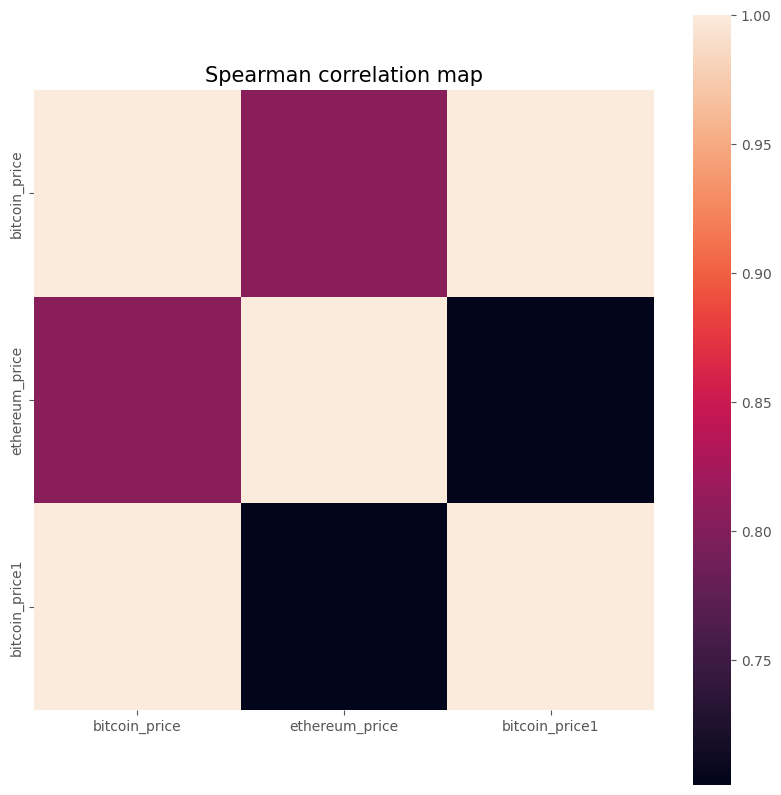

In [63]:
df = pd.DataFrame() 
currency_name = []
df['Date'] = crypto_data['bitcoin_price'].Date 
df = df[df['Date']>'2017-05-01']
for coin in crypto_data:
    currency_name.append(coin)
    temp_df = crypto_data[coin]
    df[coin] = temp_df[temp_df['Date']>'2017-05-01'].Close

temp_df = df[currency_name]
corrmat = temp_df.corr(method='spearman')
# fig, ax = plt.subplots(figsize=(5, 5))
fig, ax = plt.subplots(figsize=(10, 10))

sns.heatmap(corrmat, vmax=1., square=True)
plt.title("Spearman correlation map", fontsize=15)
plt.show()
# temp_df.corr(method='spearman')

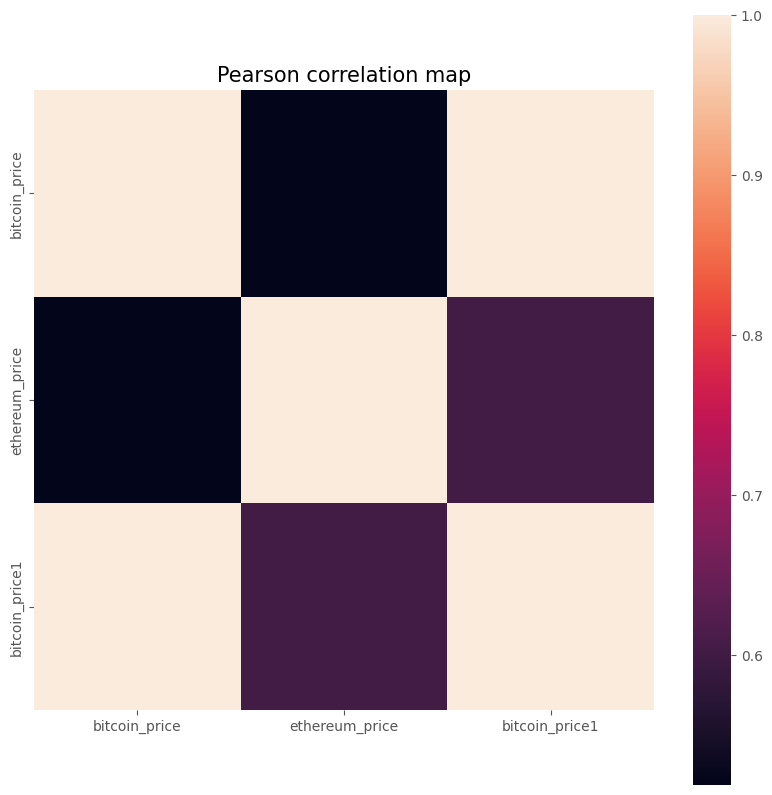

In [64]:
df = pd.DataFrame() 
currency_name = []
df['Date'] = crypto_data['bitcoin_price'].Date 
df = df[df['Date']>'2017-05-01']
for coin in crypto_data:
    currency_name.append(coin)
    temp_df = crypto_data[coin]
    df[coin] = temp_df[temp_df['Date']>'2017-05-01'].Close

temp_df = df[currency_name]
corrmat = temp_df.corr(method='pearson')
fig, ax = plt.subplots(figsize=(10, 10))
sns.heatmap(corrmat, vmax=1., square=True)
plt.title("Pearson correlation map", fontsize=15)
plt.show()
# temp_df.corr(method='pearson')


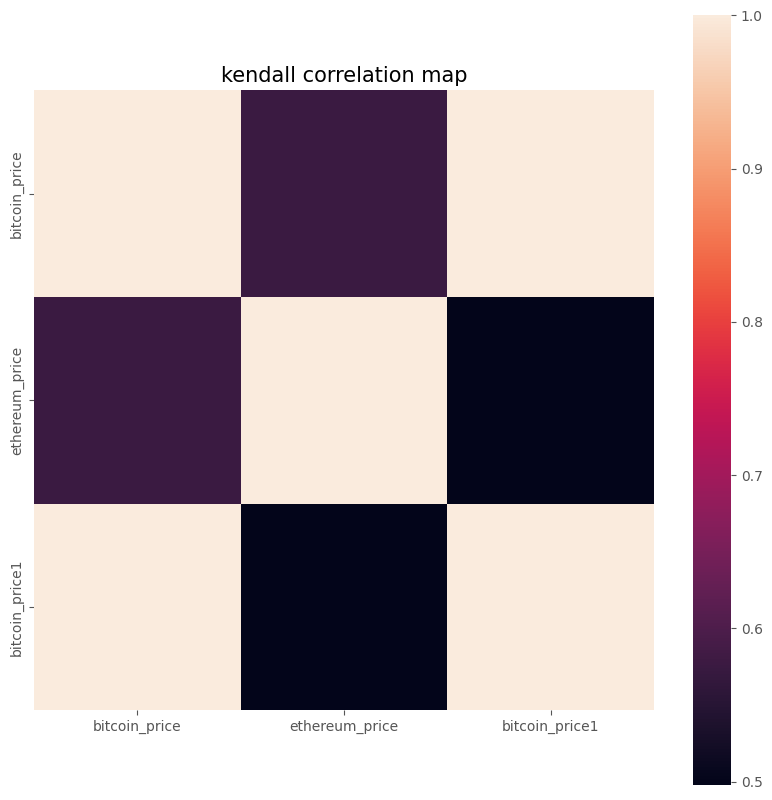

In [65]:

df = pd.DataFrame() 
currency_name = []
df['Date'] = crypto_data['bitcoin_price'].Date 
df = df[df['Date']>'2017-05-01']
for coin in crypto_data:
    currency_name.append(coin)
    temp_df = crypto_data[coin]
    df[coin] = temp_df[temp_df['Date']>'2017-05-01'].Close

temp_df = df[currency_name]
corrmat = temp_df.corr(method='kendall')
fig, ax = plt.subplots(figsize=(10, 10))
sns.heatmap(corrmat, vmax=1., square=True)
plt.title("kendall correlation map", fontsize=15)
plt.show()
# temp_df.corr(method='kendall')


# Predictive Analysis

In [66]:
# data = pd.read_csv('/content/bitcoin_price.csv',parse_dates=['Date'],index_col=['Date'])
df = pd.DataFrame(crypto_data['bitcoin_price'], columns= ['Date', 'Open','High', 'Low', 'Close', 'Volume'])
data=df.to_csv (r'/content/bitcoin_updated.csv', index = False, header=True)
data = pd.read_csv('/content/bitcoin_updated.csv',parse_dates=['Date'],index_col=['Date'])
data.head()


,Open,High,Low,Close,Volume
Date,,,,,
2020-11-28,17112.93,17853.94,16910.65,17717.42,3.260104e+10
2020-11-27,17153.91,17445.02,16526.42,17108.40,3.888649e+10
2020-11-26,18729.84,18866.29,16351.03,17150.62,6.139684e+10
2020-11-25,19104.41,19390.97,18581.15,18732.12,4.371036e+10
2020-11-24,18365.01,19348.27,18128.66,19107.46,5.146957e+10


In [67]:
data.head(3)

,Open,High,Low,Close,Volume
Date,,,,,
2020-11-28,17112.93,17853.94,16910.65,17717.42,3.260104e+10
2020-11-27,17153.91,17445.02,16526.42,17108.40,3.888649e+10
2020-11-26,18729.84,18866.29,16351.03,17150.62,6.139684e+10


In [68]:
data.tail(3)

,Open,High,Low,Close,Volume
Date,,,,,
2013-04-30,144.00,146.93,134.05,139.00,NaN
2013-04-29,134.44,147.49,134.00,144.54,NaN
2013-04-28,135.30,135.98,132.10,134.21,NaN


In [69]:
# Setting frequency to daily
data = data.sort_index(ascending=True)
data = data.resample('D').sum()

In [70]:
# Plotting a rolling mean and std of bitcoin price to check for its stationarity
data_mean = data['Close'].rolling(window=30).mean()
data_std = data['Close'].rolling(window=30).std()
rcParams['figure.figsize'] = 15, 8

In [71]:
data.index

DatetimeIndex(['2013-04-28', '2013-04-29', '2013-04-30', '2013-05-01',
               '2013-05-02', '2013-05-03', '2013-05-04', '2013-05-05',
               '2013-05-06', '2013-05-07',
               ...
               '2020-11-19', '2020-11-20', '2020-11-21', '2020-11-22',
               '2020-11-23', '2020-11-24', '2020-11-25', '2020-11-26',
               '2020-11-27', '2020-11-28'],
              dtype='datetime64[ns]', name='Date', length=2772, freq='D')

In [72]:
fig = go.Figure()
x=data.index
# Add traces
fig.add_trace(go.Scatter( x=x,y=data['Close'],name='Original'))
fig.add_trace(go.Scatter(x=x, y=data_mean,name='Rolling Mean'))
fig.add_trace(go.Scatter( x=x,y=data_std,name='Rolling Std'))
fig.update_layout(
    title="Rolling Mean and Std",
    xaxis_title="Date",
    yaxis_title="Price (USD)"
    # legend_title="Legend Title",
)
fig.show()

In [73]:
df = pd.DataFrame(crypto_data['bitcoin_price'], columns= ['Date', 'Open','High', 'Low', 'Close', 'Volume'])

In [91]:
# #ATR
def wwma(values, n):
    """
     J. Welles Wilder's EMA 
    """
    return values.ewm(alpha=1/n, adjust=False).mean()

def atr(df, n=14):
    data = df.copy()
    high = data['High']
    low = data['Low']
    close = data['Close']
    data['tr0'] = abs(high - low)
    data['tr1'] = abs(high - close.shift())
    data['tr2'] = abs(low - close.shift())
    tr = data[['tr0', 'tr1', 'tr2']].max(axis=1)
    atr = wwma(tr, n)
    return atr

# atr(crypto_data['bitcoin_price'], 14)

In [92]:
new_col= atr(crypto_data['bitcoin_price'], 14)

In [93]:
fig = go.Figure()
# data=data.sort_index(ascending=False)
x=data.index
# Add traces
fig.add_trace(go.Scatter( x=x,y=new_col,name='ATR'))
#fig.add_trace(go.Scatter( x=x,y=data['Close'],name='Original'))
fig.update_layout(
    title="Average True Range",
    xaxis_title="Date",
    )
fig.show()

In [76]:
# #Plotting RSI 
# def computeRSI (data, time_window):
#     diff = data.diff(1).dropna()        # diff in one field(one day)

#     #this preservers dimensions off diff values
#     up_chg = 0 * diff
#     down_chg = 0 * diff

#     # up change is equal to the positive difference, otherwise equal to zero
#     up_chg[diff > 0] = diff[ diff>0 ]

#     # down change is equal to negative deifference, otherwise equal to zero
#     down_chg[diff < 0] = diff[ diff < 0 ]

#     # calculate EMAs
#     up_chg_avg   = up_chg.ewm(com=time_window-1 , min_periods=time_window).mean()
#     down_chg_avg = down_chg.ewm(com=time_window-1 , min_periods=time_window).mean()

#     rs = abs(up_chg_avg/down_chg_avg)
#     rsi = 100 - 100/(1+rs)
#     return rsi

# data['RSI'] = computeRSI(data['Close'], 14)

# # get rid of the first 14 NA values
# rsibtc = data[-1448:]

# rsibtc.head()

# Position = []

# for i in range(0,rsibtc.shape[0]):
#     if rsibtc['RSI'].iloc[i] < 70 and rsibtc['RSI'].iloc[i-1] > 70:
#         Position.append('Short')
#     elif rsibtc['RSI'].iloc[i] > 30 and rsibtc['RSI'].iloc[i-1] < 30:
#         Position.append('Long')
#     else:
#         Position.append(Position.iloc[i-1])
#         Position.append('Long')
# rsibtc['Position'] = Position
# rsibtc.tail()

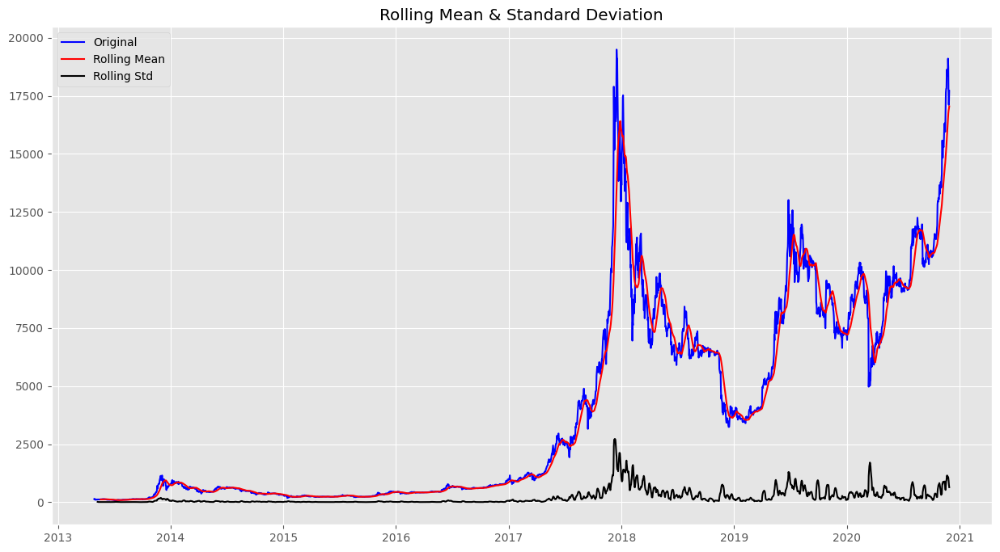

ADF Stastistic: -0.479862
p-value: 0.895887
The graph is non stationery
Critical values:
Critical Value (1%) -3.4327353600205757
Critical Value (5%) -2.862593880583324
Critical Value (10%) -2.5673310144635737


In [94]:
from statsmodels.tsa.stattools import adfuller

def test_stationarity(x):


    #Determing rolling statistics
    rolmean = x.rolling(window=22,center=False).mean()

    rolstd = x.rolling(window=12,center=False).std()
    
    #Plot rolling statistics:
    orig = plt.plot(x, color='blue',label='Original')
    mean = plt.plot(rolmean, color='red', label='Rolling Mean')
    std = plt.plot(rolstd, color='black', label = 'Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation')
    plt.show(block=False)
    
    #Perform Dickey Fuller test    
    result=adfuller(x)
    print('ADF Stastistic: %f'%result[0])
    print('p-value: %f'%result[1])
    pvalue=result[1]
    for key,value in result[4].items():
         if result[0]>value:
            print("The graph is non stationery")
            break
         else:
            print("The graph is stationery")
            break;
    print('Critical values:')
    for key,value in result[4].items():
        # print('\t%s: %.3f ' % (key, value))
        print('Critical Value (%s)'%key  ,value)
    
        
ts = data['Close']      
test_stationarity(ts)

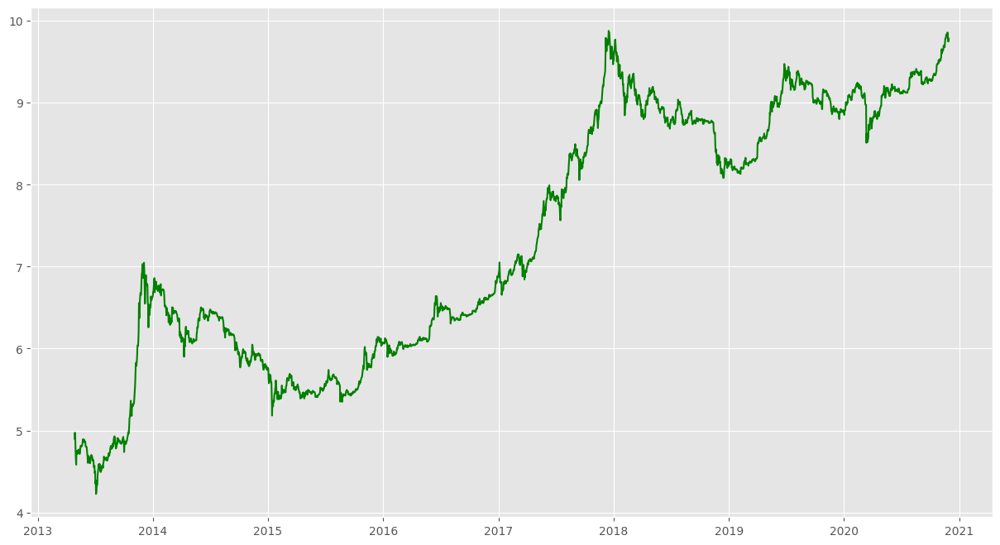

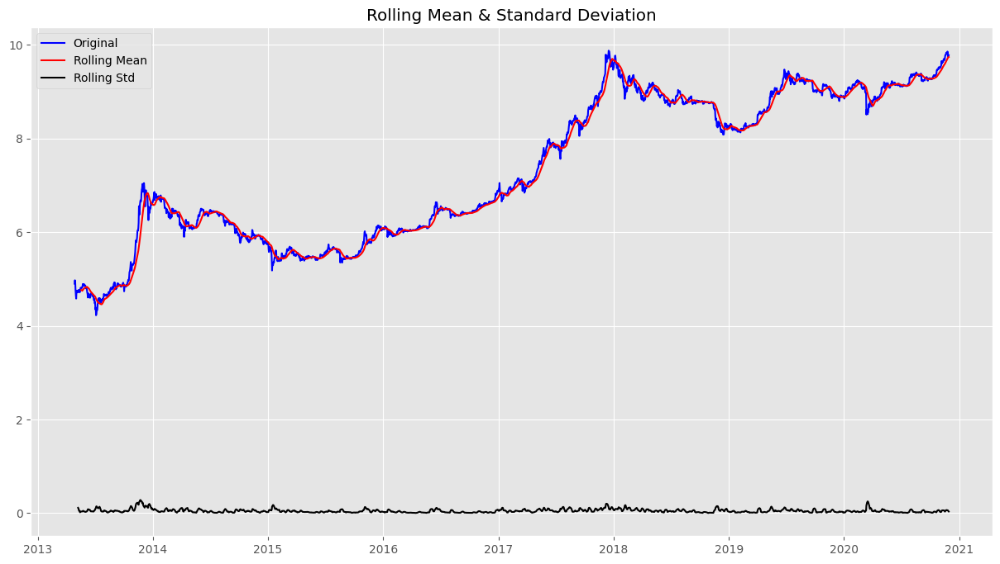

ADF Stastistic: -1.046275
p-value: 0.736015
The graph is non stationery
Critical values:
Critical Value (1%) -3.4327266904892513
Critical Value (5%) -2.862590051808033
Critical Value (10%) -2.5673289760243105


In [96]:
ts_log = np.log(ts)
plt.plot(ts_log,color="green")
plt.show()

test_stationarity(ts_log)

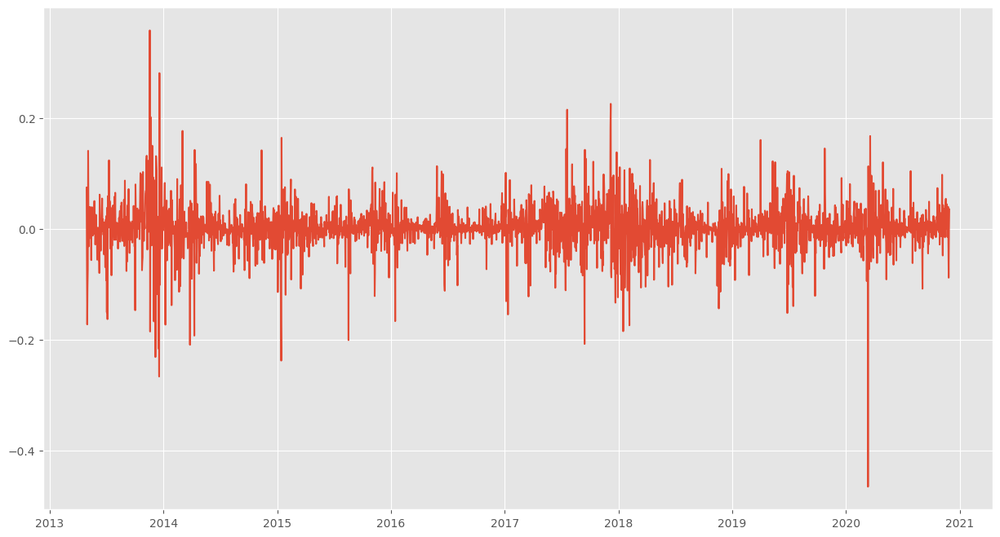

In [97]:
ts_log_diff = ts_log - ts_log.shift()
plt.plot(ts_log_diff)
plt.show()

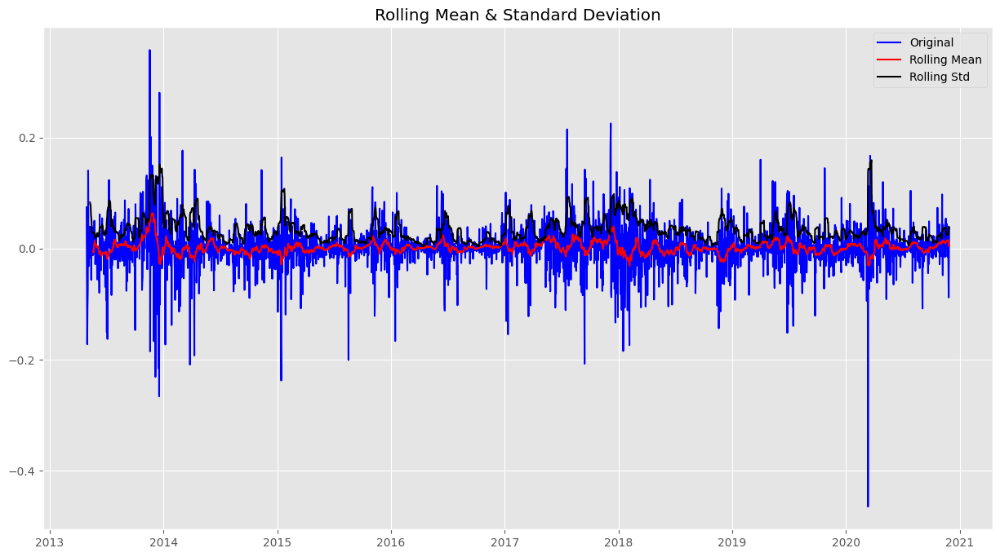

ADF Stastistic: -10.648052
p-value: 0.000000
The graph is stationery
Critical values:
Critical Value (1%) -3.4327266904892513
Critical Value (5%) -2.862590051808033
Critical Value (10%) -2.5673289760243105


In [98]:
ts_log_diff.dropna(inplace=True)
test_stationarity(ts_log_diff)

In [99]:
# #Performing dicky fuller test 

# print('Results of Dickey Fuller Test:')
# dftest = adfuller(data['Close'], autolag='AIC')
# dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
# for key,value in dftest[4].items():
#     dfoutput['Critical Value (%s)'%key] = value
#     print(dfoutput)
    

ValueError: ignored

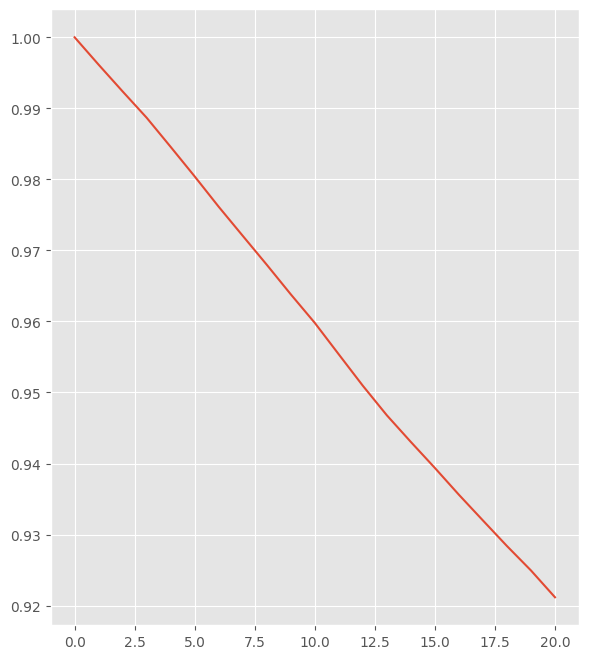

In [100]:
# Plot ACF and PACF plots to infer parameters for MA, ARIMA, and SARIMAX models

lag_acf = acf(data.Close, nlags=20) 
lag_pacf = pacf(data.Close, nlags=20, method='ols') 

# Plot ACF: 
plt.subplot(121) 
plt.plot(lag_acf) 
plt.bar(x=np.arange(0,41) ,height = acf(data.Open)) 
plt.axhline(y=0, linestyle='--', color='gray') 
plt.axhline(y=-1.96/np.sqrt(len(data)), linestyle='--', color='gray') 
plt.axhline(y=1.96/np.sqrt(len(data)), linestyle='--', color='gray') 
plt.title('Autocorrelation Function')
# plt.show()

# Plot PACF 
plt.subplot(122) 
# plt.plot(lag_pacf) 
plt.bar(x=np.arange(0,41), height=pacf(data.Open))
plt.axhline(y=0, linestyle='--', color='gray') 
plt.axhline(y=-1.96/np.sqrt(len(data)), linestyle='--', color='gray') 
plt.axhline(y=1.96/np.sqrt(len(data)), linestyle='--', color='gray') 
plt.title('Partial Autocorrelation Function')           
plt.tight_layout()
plt.show()

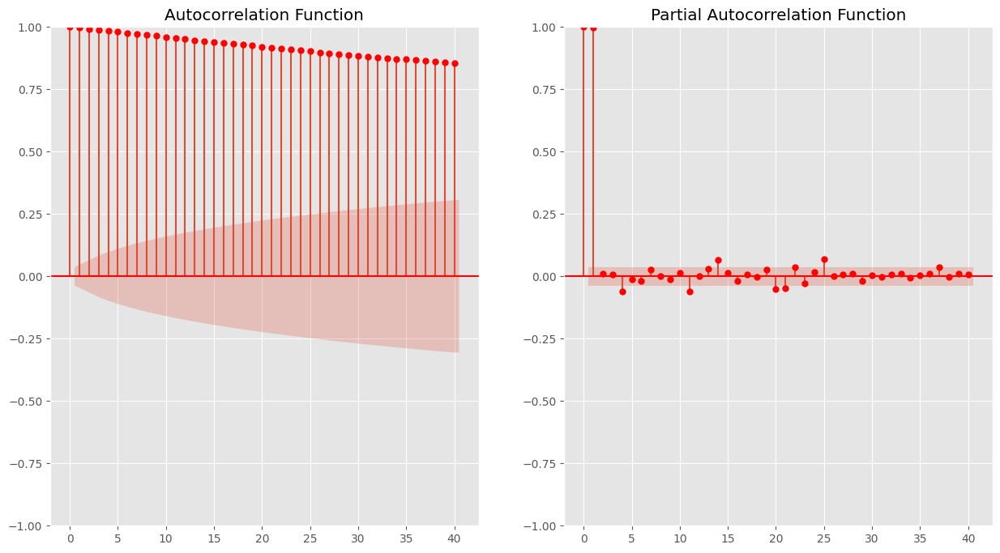

In [101]:
plot_acf(data['Close'], lags=40,title='Autocorrelation Function' ,color = 'red', ax=plt.subplot(121))
plot_pacf(data['Close'], lags=40, title='Partial Autocorrelation Function', ax=plt.subplot(122), color = 'red')
plt.show()

In [102]:
# Time series decomposition
data.Close_decompose = data.Close
data.Close_decompose
from statsmodels.tsa.seasonal import seasonal_decompose
result = seasonal_decompose(data.Close_decompose, model="multiplicative")
result
display(list(filter(lambda x: x[0] != "_" ,dir(result))))
display(result.seasonal.head())
trace1 = go.Scatter(
    x=result.observed.index,
    y=result.observed
)

trace2 = go.Scatter(
    x=result.trend.index,
    y=result.trend,
    xaxis='x2',
    yaxis='y2'
)

trace3 = go.Scatter(
    x=result.seasonal.index,
    y=result.seasonal,
    xaxis='x3',
    yaxis='y3'
)

trace4 = go.Scatter(
    x=result.resid.index,
    y=result.resid,
    xaxis='x4',
    yaxis='y4'
)

data2 = [trace1, trace2, trace3, trace4]
layout = go.Layout(
    showlegend=False
)

fig = tools.make_subplots(
    rows=4,
    cols=1,
    print_grid=False
)

fig.append_trace(trace1, 1, 1)
fig.append_trace(trace2, 2, 1)
fig.append_trace(trace3, 3, 1)
fig.append_trace(trace4, 4, 1)

fig['layout'].update(
    title='Timeseries Decomposition',
    showlegend=False,
    height=600,
    yaxis=dict(title="Observed"),
    yaxis2=dict(title="Trend"),
    yaxis3=dict(title="Seasonal"),
    yaxis4=dict(title="Residual"),
    xaxis4=dict(title="Month")
)
fig.show()

['nobs', 'observed', 'plot', 'resid', 'seasonal', 'trend', 'weights']

Date
2013-04-28    0.997624
2013-04-29    1.002249
2013-04-30    1.002546
2013-05-01    1.000756
2013-05-02    0.998855
Freq: D, Name: seasonal, dtype: float64

/usr/local/lib/python3.10/dist-packages/plotly/tools.py:460: DeprecationWarning:

plotly.tools.make_subplots is deprecated, please use plotly.subplots.make_subplots instead



# Single moving average

In [103]:
# SMA_train = data.Close
SMA_train = crypto_data['bitcoin_price'].Close

In [104]:
# Single Moving Average

SMA_model = ARIMA(data.Close, order=(1,0, 1))
SMA_model_fit = SMA_model.fit()
print(SMA_model_fit.summary())
SMA_pred = SMA_model_fit.predict()

                               SARIMAX Results                                
Dep. Variable:                  Close   No. Observations:                 2772
Model:                 ARIMA(1, 0, 1)   Log Likelihood              -19379.063
Date:                Mon, 15 May 2023   AIC                          38766.127
Time:                        12:46:02   BIC                          38789.836
Sample:                    04-28-2013   HQIC                         38774.689
                         - 11-28-2020                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       3909.9851      0.163    2.4e+04      0.000    3909.665    3910.305
ar.L1          0.9998      0.000   2632.236      0.000       0.999       1.001
ma.L1          0.0206      0.006      3.429      0.0

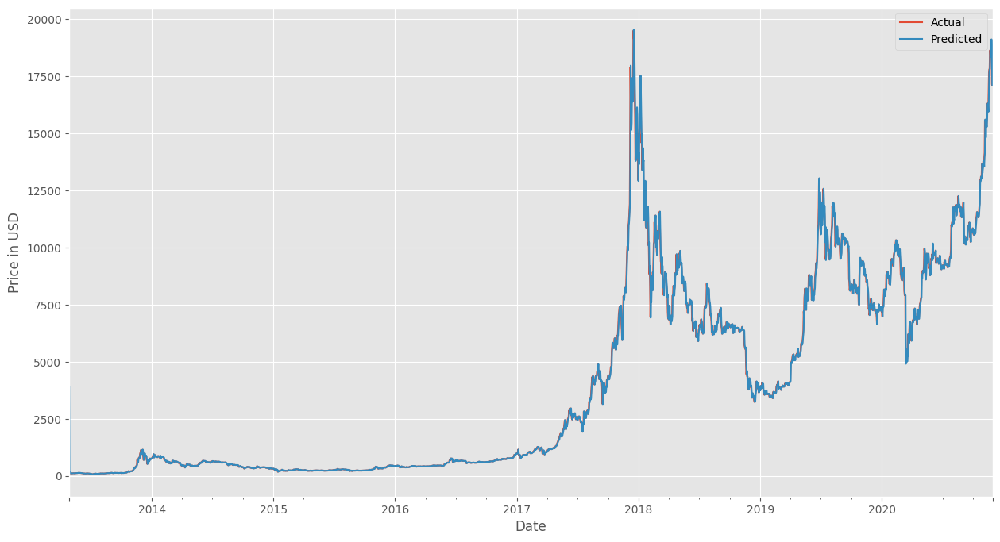

In [105]:
#Plotting actual vs predicted

data['Close'].plot(label='Actual')
SMA_pred.plot(label='Predicted')
plt.ylabel('Price in USD', fontsize=12)
plt.legend()
plt.show()

In [106]:
def mean_absolute_percentage_error(y_true, y_pred): 
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

In [107]:
# Calculating accuracy using RMSE

# np.sqrt(mean_squared_error(data.Open,SMA_pred)
summary = list()
summary.append({
        'MSE': mean_squared_error(data.Close,SMA_pred),
        'MAE': mean_absolute_error(data.Close,SMA_pred),
        'R2': r2_score(data.Close,SMA_pred),
        'MAPE' : mean_absolute_percentage_error(data.Close,SMA_pred),
        'name': 'Simple moving average',
    })

In [108]:
summary

[{'MSE': 74103.77218625782,
  'MAE': 112.3543193953102,
  'R2': 0.9959971952181149,
  'MAPE': 3.6714865092140885,
  'name': 'Simple moving average'}]

# ARIMA Model

In [109]:
df_bitcoin = pd.DataFrame(crypto_data['bitcoin_price'])
df_bitcoin = df_bitcoin[['Date','Close']]
df_bitcoin.set_index('Date', inplace = True)

                               SARIMAX Results                                
Dep. Variable:                  Close   No. Observations:                 2772
Model:                 ARIMA(5, 1, 0)   Log Likelihood              -19359.223
Date:                Mon, 15 May 2023   AIC                          38730.446
Time:                        12:49:08   BIC                          38766.008
Sample:                             0   HQIC                         38743.290
                               - 2772                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0179      0.006      3.024      0.002       0.006       0.030
ar.L2         -0.0220      0.007     -2.965      0.003      -0.037      -0.007
ar.L3          0.0059      0.007      0.818      0.4

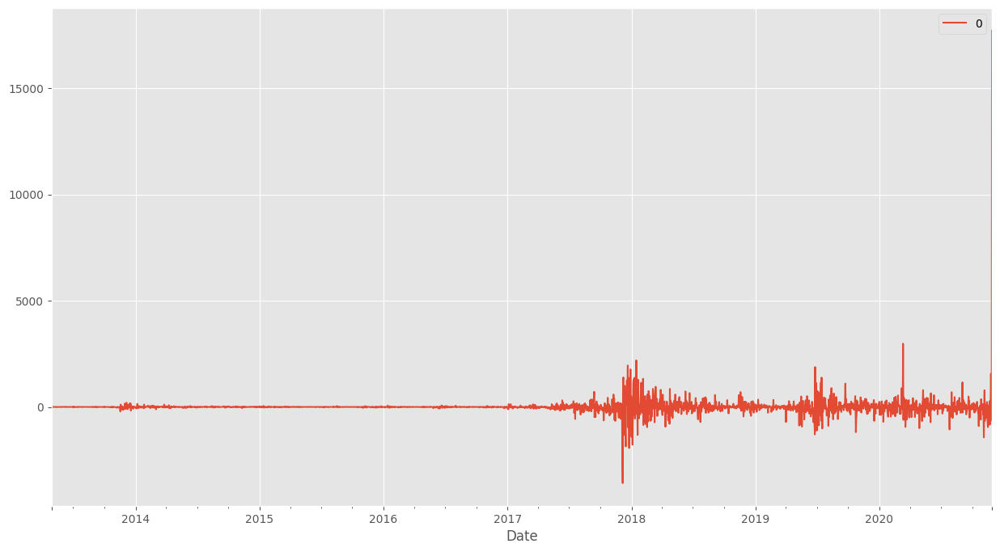

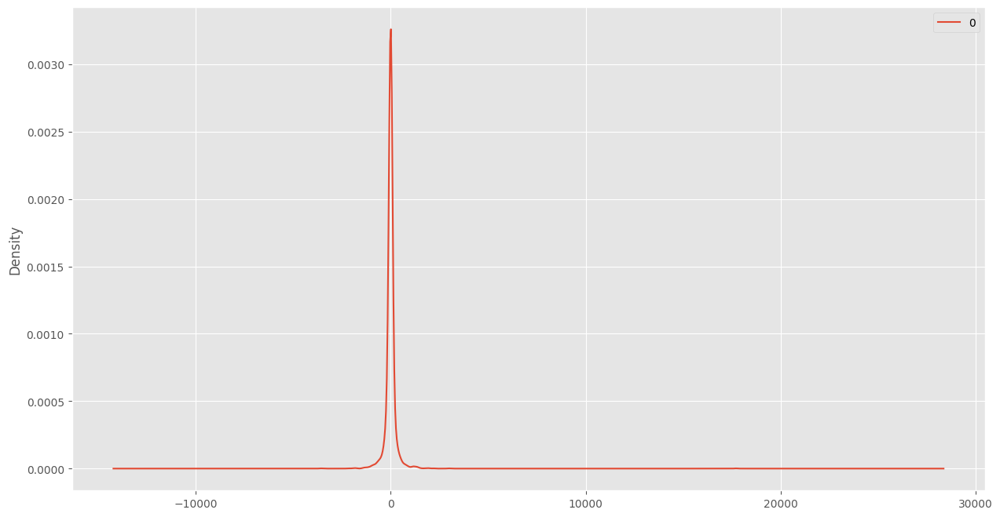

                  0
count   2772.000000
mean       0.461627
std      426.378061
min    -3580.688505
25%      -27.311239
50%       -1.051403
75%       13.186502
max    17717.420000


In [114]:
# ARIMA model


model = smapi.tsa.arima.ARIMA(df_bitcoin, order=(5,1,0))
model_fit = model.fit()
print(model_fit.summary())
ARIMA_predictions = model_fit.predict()

# plot residual errors
residuals = DataFrame(model_fit.resid)
residuals.plot()
plt.show()
residuals.plot(kind='kde')
plt.show()
print(residuals.describe())

Test MSE: 26.393


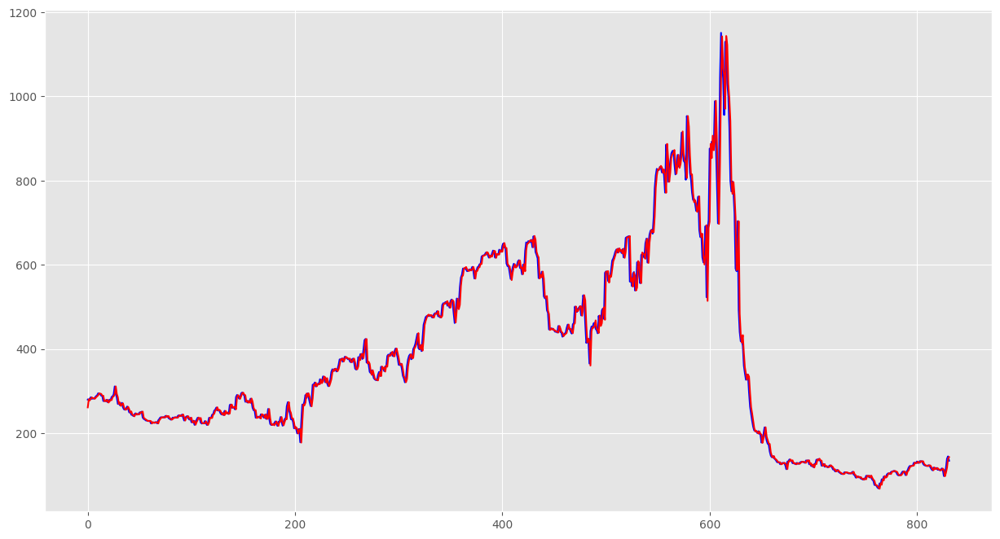

In [117]:
#Plotting actual vs predicted

X = df_bitcoin.values
size = int(len(X) * 0.70)
train, test = X[0:size], X[size:len(X)]
history = [x for x in train]
predictions = list()
for t in range(len(test)):
    model = ARIMA(history, order=(5,1,0))
    model_fit = model.fit()
    output = model_fit.forecast()
    yhat = output[0]
    predictions.append(yhat)
    obs = test[t]
    history.append(obs)
    # print('predicted=%f, expected=%f' % (yhat, obs))
error = np.sqrt(mean_squared_error(test, predictions))
print('Test MSE: %.3f' % error)
# plot
plt.plot(test, color='blue',label='Actual' )
plt.plot(predictions, color='red', label='Predicted')
plt.show()


In [119]:
#Calculating accuracy using RMSE


np.sqrt(mean_squared_error(test, predictions))

summary.append({
        'MSE': mean_squared_error(test, predictions),
        'MAE': mean_absolute_error(test, predictions),
        # 'RMSE': root_mean_squared_error(test, predictions),
        'RMSE': mean_squared_error(test, predictions),
        'MAPE' : mean_absolute_percentage_error(test, predictions),
        'R2': r2_score(test, predictions),
        'name': 'ARIMA',
    })

In [120]:
summary

[{'MSE': 74103.77218625782,
  'MAE': 112.3543193953102,
  'R2': 0.9959971952181149,
  'MAPE': 3.6714865092140885,
  'name': 'Simple moving average'},
 {'MSE': 696.5708457700892,
  'MAE': 12.34548242912491,
  'RMSE': 696.5708457700892,
  'MAPE': 96.87700963435374,
  'R2': 0.9862173986532442,
  'name': 'ARIMA'}]

# SARIMAX model

                                     SARIMAX Results                                      
Dep. Variable:                              Close   No. Observations:                 2772
Model:             SARIMAX(1, 0, 2)x(1, 0, 2, 30)   Log Likelihood              -18873.084
Date:                            Mon, 15 May 2023   AIC                          37764.167
Time:                                    13:05:19   BIC                          37817.306
Sample:                                         0   HQIC                         37783.381
                                           - 2772                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept     59.5758     24.853      2.397      0.017      10.865     108.287
drift         -0.0264      0.021   

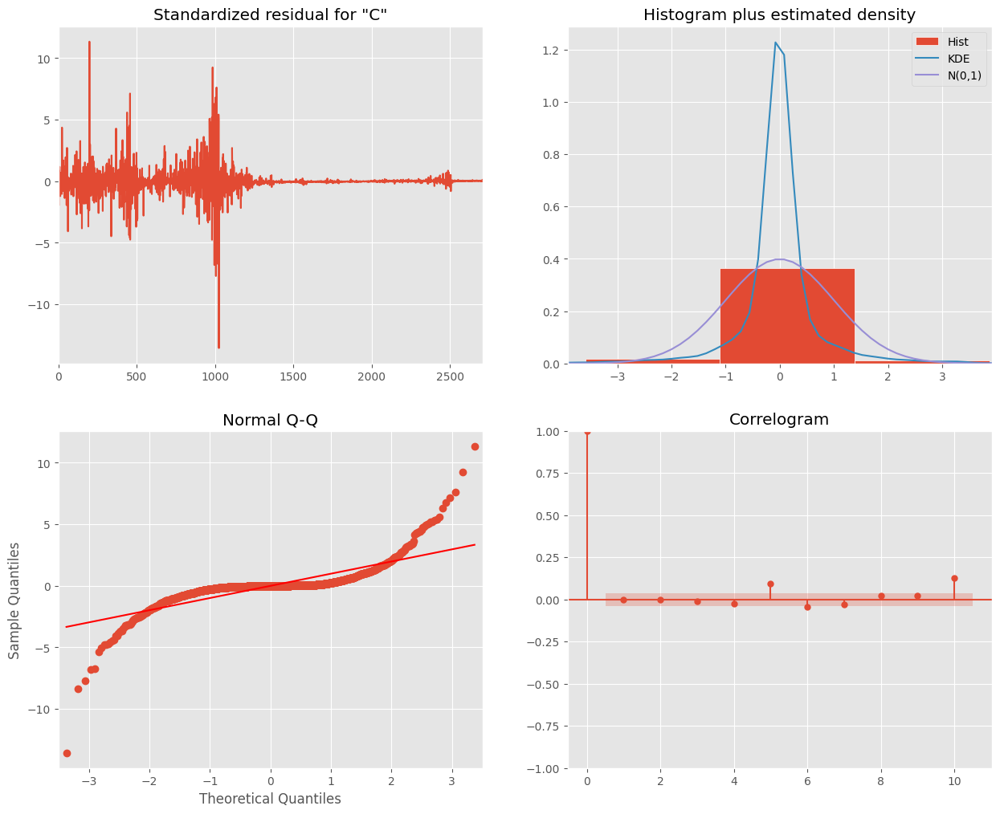

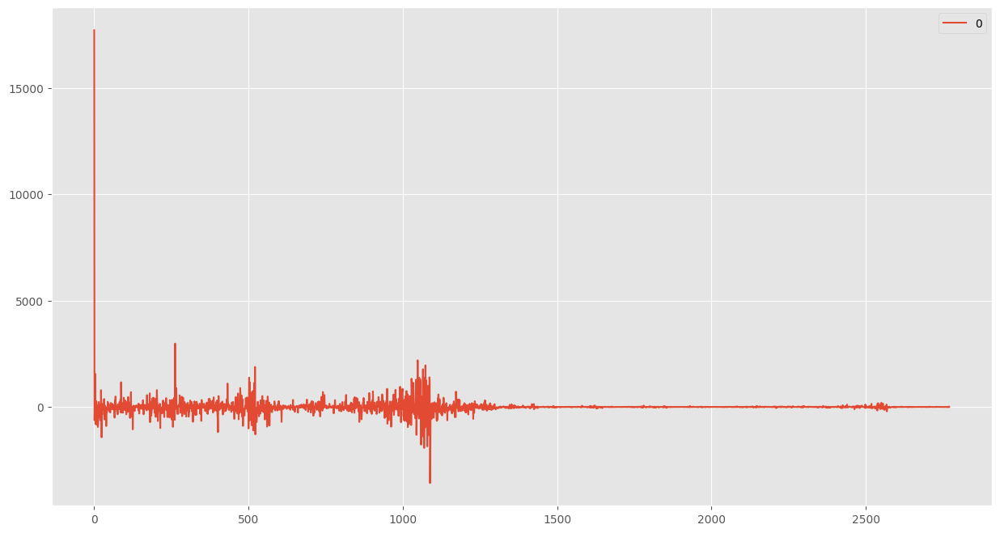

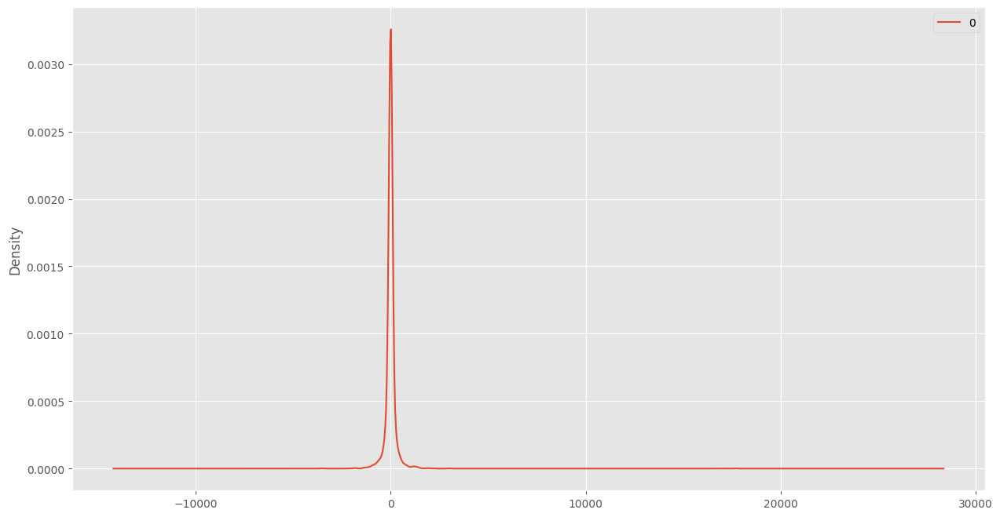

                  0
count   2771.000000
mean       0.464946
std      426.455006
min    -3580.687292
25%      -27.360932
50%       -1.051342
75%       13.197210
max    17717.420000


In [121]:
# SARIMAX model


SARIMAX_model = SARIMAX(df_bitcoin, order=(1,0,2), seasonal_order=(1, 0, 2,30),enforce_invertibility=False,enforce_stationarity=False,trend='ct')
SARIMAX_model_fit = SARIMAX_model.fit(disp=0)
SARIMAX_model_fit.plot_diagnostics(figsize=(15, 12))
print(SARIMAX_model_fit.summary())

# plot residual errors
SARIMAX_model_residuals = DataFrame(model_fit.resid)
SARIMAX_model_residuals.plot()
plt.show()
SARIMAX_model_residuals.plot(kind='kde')
plt.show()
print(SARIMAX_model_residuals.describe())


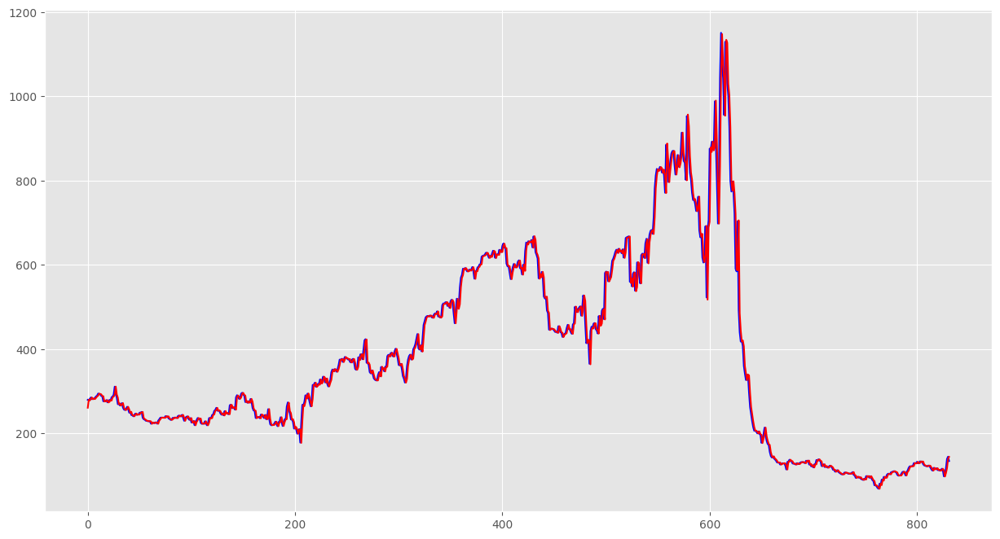

In [122]:
Y = df_bitcoin.values
size = int(len(Y) * 0.70)
train, test = Y[0:size], Y[size:len(Y)]
history = [y for y in train]
SARIMAX_predictions = list()
for t in range(len(test)):
    SARIMAX_model = SARIMAX(history, order=(1,0,2))
    SARIMAX_model_fit = SARIMAX_model.fit(disp=0)
    SARIMAX_output = SARIMAX_model_fit.forecast()
    SARIMAX_yhat = SARIMAX_output[0]
    SARIMAX_predictions.append(SARIMAX_yhat)
    SARIMAX_obs = test[t]
    history.append(SARIMAX_obs)
    # print('predicted=%f, expected=%f' % (yhat, obs))

# plot
plt.plot(test,color='blue', label='Actual')
plt.plot(SARIMAX_predictions, color='red', label='Predicted')
plt.show()


In [123]:
 # Calculating accuracy using RMSE


np.sqrt(mean_squared_error(test, SARIMAX_predictions))

summary.append({
        'MSE': mean_squared_error(test, SARIMAX_predictions),
        'MAE': mean_absolute_error(test, SARIMAX_predictions),
        'MAPE' : mean_absolute_percentage_error(test, SARIMAX_predictions),
        'R2': r2_score(test, SARIMAX_predictions),
        'name': 'SARIMA',
    })

In [124]:
summary

[{'MSE': 74103.77218625782,
  'MAE': 112.3543193953102,
  'R2': 0.9959971952181149,
  'MAPE': 3.6714865092140885,
  'name': 'Simple moving average'},
 {'MSE': 696.5708457700892,
  'MAE': 12.34548242912491,
  'RMSE': 696.5708457700892,
  'MAPE': 96.87700963435374,
  'R2': 0.9862173986532442,
  'name': 'ARIMA'},
 {'MSE': 707.5580970814224,
  'MAE': 12.332239663871711,
  'MAPE': 96.8267866477355,
  'R2': 0.986000000946119,
  'name': 'SARIMA'}]

#Linear Regressor

In [125]:
df_linear = crypto_data['bitcoin_price']
df_linear.isnull().any()

Unnamed: 0    False
Date          False
Open          False
High          False
Low           False
Close         False
Volume         True
dtype: bool

In [126]:
df_linear= df_linear.drop('Date',1)
df_linear= df_linear.drop('Volume',1)

In [127]:
from sklearn.preprocessing import StandardScaler
cols = df_linear.columns.values
print (cols)
print(df_linear.dtypes)

['Unnamed: 0' 'Open' 'High' 'Low' 'Close']
Unnamed: 0      int64
Open          float64
High          float64
Low           float64
Close         float64
dtype: object


In [128]:
# df_linear.replace(',','', regex=True, inplace=True)
# c = df_linear.select_dtypes(object).columns
# df_linear[c] = df_linear[c].apply(pd.to_numeric,errors='coerce')
# df_linear.dtypes

In [129]:
sn = StandardScaler()
df_linear[cols] = sn.fit_transform(df_linear[cols])
df_linear.head()

,Unnamed: 0,Open,High,Low,Close
0,-1.731426,3.075336,3.138432,3.147583,3.209039
1,-1.730176,3.084877,3.045784,3.055333,3.067495
2,-1.728927,3.451781,3.367799,3.013223,3.077307
3,-1.727677,3.538988,3.486674,3.548655,3.444870
4,-1.726427,3.366843,3.477000,3.440016,3.532104


In [130]:
X = df_linear.drop('Close',1).values
y = df_linear['Close']

In [131]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)

In [132]:
from sklearn.linear_model import LinearRegression
model=LinearRegression()

In [133]:
model.fit(X_train,y_train)

LinearRegression()

In [134]:
# print ('Residual sum of squares Train: %.2f' % np.mean((model.predict(X_train)- y_train) ** 2))
# print ('Residual sum of squares Test: %.2f' % np.mean((model.predict(X_test)- y_test) ** 2))

In [135]:
y_pred = model.predict(X_test)

In [136]:
summary.append({
        'MSE': mean_squared_error(y_test, y_pred),
        'MAE': mean_absolute_error(y_test, y_pred),
        'MAPE' : mean_absolute_percentage_error(y_test, y_pred),
        'R2': r2_score(y_test, y_pred),
        'name': 'Linear regression',
    })

In [137]:
summary

[{'MSE': 74103.77218625782,
  'MAE': 112.3543193953102,
  'R2': 0.9959971952181149,
  'MAPE': 3.6714865092140885,
  'name': 'Simple moving average'},
 {'MSE': 696.5708457700892,
  'MAE': 12.34548242912491,
  'RMSE': 696.5708457700892,
  'MAPE': 96.87700963435374,
  'R2': 0.9862173986532442,
  'name': 'ARIMA'},
 {'MSE': 707.5580970814224,
  'MAE': 12.332239663871711,
  'MAPE': 96.8267866477355,
  'R2': 0.986000000946119,
  'name': 'SARIMA'},
 {'MSE': 0.0005505735025683162,
  'MAE': 0.010364103547559353,
  'MAPE': 3.887564897543673,
  'R2': 0.9994854167914449,
  'name': 'Linear regression'}]

#Support Vector Regressor 

In [138]:
df_svr=df_linear
df_svr.dtypes

Unnamed: 0    float64
Open          float64
High          float64
Low           float64
Close         float64
dtype: object

In [139]:
X = df_svr.drop('Close',1).values
y = df_svr['Close']

In [140]:
X = df_svr.iloc[:, 1:3].values
y = df_svr.iloc[:, 3:4].values

#Feature Scaling
from sklearn.preprocessing import StandardScaler
sc_X = StandardScaler()
sc_y = StandardScaler()
X = sc_X.fit_transform(X)
y = sc_y.fit_transform(y)

# Fitting the Support Vector Regression Model to the dataset

from sklearn.svm import SVR

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)

regressor = SVR(kernel='rbf')
# regressor.fit(X,y)
regressor.fit(X_train,y_train)

y_pred = regressor.predict(X_test) 

In [141]:
summary.append({
        'MSE': mean_squared_error(y_test, y_pred),
        'MAE': mean_absolute_error(y_test, y_pred),
        'MAPE' : mean_absolute_percentage_error(y_test, y_pred),
        'R2': r2_score(y_test, y_pred),
        'name': 'Support Vector Regression',
    })

In [142]:
summary

[{'MSE': 74103.77218625782,
  'MAE': 112.3543193953102,
  'R2': 0.9959971952181149,
  'MAPE': 3.6714865092140885,
  'name': 'Simple moving average'},
 {'MSE': 696.5708457700892,
  'MAE': 12.34548242912491,
  'RMSE': 696.5708457700892,
  'MAPE': 96.87700963435374,
  'R2': 0.9862173986532442,
  'name': 'ARIMA'},
 {'MSE': 707.5580970814224,
  'MAE': 12.332239663871711,
  'MAPE': 96.8267866477355,
  'R2': 0.986000000946119,
  'name': 'SARIMA'},
 {'MSE': 0.0005505735025683162,
  'MAE': 0.010364103547559353,
  'MAPE': 3.887564897543673,
  'R2': 0.9994854167914449,
  'name': 'Linear regression'},
 {'MSE': 0.0054294328219645005,
  'MAE': 0.056437301707613255,
  'MAPE': 416.0553925353529,
  'R2': 0.9948727098100718,
  'name': 'Support Vector Regression'}]

# LSTM

In [143]:
#Use MinMaxScaler to normalize Close to range from 0 to 1
from sklearn.preprocessing import MinMaxScaler
values = data['Close'].values.reshape(-1,1)
values = values.astype('float32')
scaler = MinMaxScaler(feature_range=(0, 1))
scaled = scaler.fit_transform(values)
# Split 70% of data for training and 30% for testing
train_size = int(len(scaled) * 0.7)
test_size = len(scaled) - train_size
train, test = scaled[0:train_size,:], scaled[train_size:len(scaled),:]
print(len(train), len(test))

1940 832


In [144]:
def create_dataset(dataset, look_back=1):
    dataX, dataY = [], []
    for i in range(len(dataset) - look_back):
         a = dataset[i:(i + look_back), 0]
         dataX.append(a)
         dataY.append(dataset[i + look_back, 0])
    print(len(dataY))
    return np.array(dataX), np.array(dataY)

look_back = 1
trainX, trainY = create_dataset(train, look_back)
testX, testY = create_dataset(test, look_back)
# Reshape X for model training
trainX = np.reshape(trainX, (trainX.shape[0], 1, trainX.shape[1]))
testX = np.reshape(testX, (testX.shape[0], 1, testX.shape[1]))

1939
831


In [145]:
# Running the LSTM model with 600 epochs
model = Sequential()
model.add(LSTM(100, input_shape=(trainX.shape[1], trainX.shape[2])))
model.add(Dense(1))
model.compile(loss='mae', optimizer='adam')
history = model.fit(trainX, trainY,epochs=600, batch_size=50,  validation_data=(testX, testY), verbose=1, shuffle=False)

Epoch 1/600
39/39 [==============================] - 10s 46ms/step - loss: 0.0799 - val_loss: 0.3114
Epoch 2/600
39/39 [==============================] - 0s 11ms/step - loss: 0.0921 - val_loss: 0.3039
Epoch 3/600
39/39 [==============================] - 0s 13ms/step - loss: 0.0723 - val_loss: 0.2578
Epoch 4/600
39/39 [==============================] - 1s 15ms/step - loss: 0.0684 - val_loss: 0.2179
Epoch 5/600
39/39 [==============================] - 0s 11ms/step - loss: 0.0566 - val_loss: 0.1599
Epoch 6/600
39/39 [==============================] - 1s 15ms/step - loss: 0.0470 - val_loss: 0.0955
Epoch 7/600
39/39 [==============================] - 0s 12ms/step - loss: 0.0304 - val_loss: 0.0156
Epoch 8/600
39/39 [==============================] - 0s 12ms/step - loss: 0.0269 - val_loss: 0.0124
Epoch 9/600
39/39 [==============================] - 1s 18ms/step - loss: 0.0072 - val_loss: 0.0136
Epoch 10/600
39/39 [==============================] - 1s 14ms/step - loss: 0.0119 - val_loss: 0.010

In [146]:
# # Make prediction using textX and plotting line graph against testY
yhat = model.predict(testX)
# plt.plot(yhat, label='predict')
# plt.plot(testY, label='true')
# plt.legend()
# plt.show()


26/26 [==============================] - 1s 2ms/step


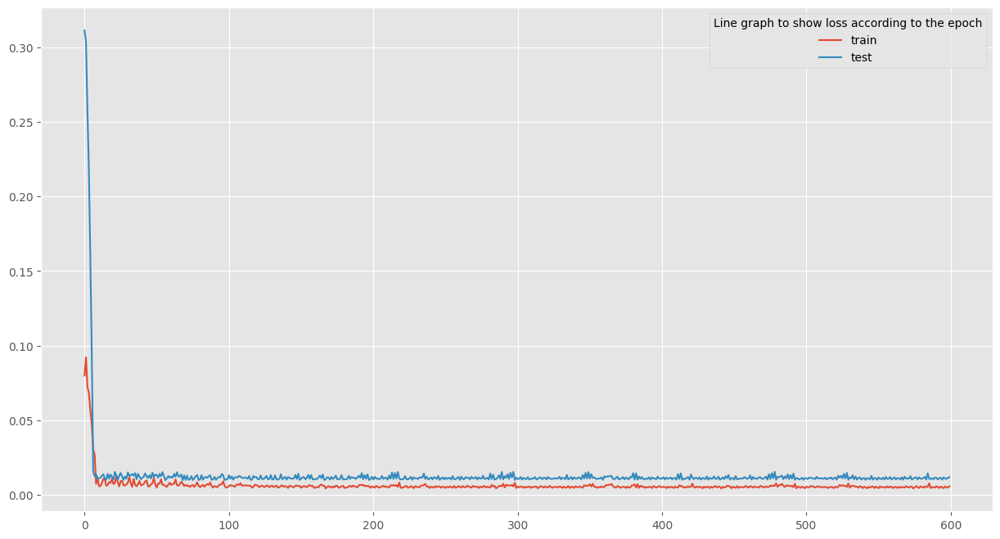

In [147]:
# Line graph to show loss according to the epoch
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='test')
plt.legend(title="Line graph to show loss according to the epoch")
plt.show()

In [148]:
# # Summary
rmse = np.sqrt(mean_squared_error(testY, yhat))

print('Test RMSE: %.3f' % rmse)

summary.append({
        'MSE': mean_squared_error(testY, yhat),
        'MAE': mean_absolute_error(testY, yhat),
        'MAPE' : mean_absolute_percentage_error(testY, yhat),
        'R2': r2_score(testY, yhat),
        'name': 'LSTM'
    })

Test RMSE: 0.017


In [149]:
summary

[{'MSE': 74103.77218625782,
  'MAE': 112.3543193953102,
  'R2': 0.9959971952181149,
  'MAPE': 3.6714865092140885,
  'name': 'Simple moving average'},
 {'MSE': 696.5708457700892,
  'MAE': 12.34548242912491,
  'RMSE': 696.5708457700892,
  'MAPE': 96.87700963435374,
  'R2': 0.9862173986532442,
  'name': 'ARIMA'},
 {'MSE': 707.5580970814224,
  'MAE': 12.332239663871711,
  'MAPE': 96.8267866477355,
  'R2': 0.986000000946119,
  'name': 'SARIMA'},
 {'MSE': 0.0005505735025683162,
  'MAE': 0.010364103547559353,
  'MAPE': 3.887564897543673,
  'R2': 0.9994854167914449,
  'name': 'Linear regression'},
 {'MSE': 0.0054294328219645005,
  'MAE': 0.056437301707613255,
  'MAPE': 416.0553925353529,
  'R2': 0.9948727098100718,
  'name': 'Support Vector Regression'},
 {'MSE': 0.0003009577,
  'MAE': 0.011675305,
  'MAPE': 48.173704743385315,
  'R2': 0.9869909230725479,
  'name': 'LSTM'}]

In [150]:
summary = pd.DataFrame(summary)

fig = tools.make_subplots(rows=1, cols=3, subplot_titles=(
    'R2', 'MAE', 'MSE'
))

trace0 = go.Bar(x=summary['name'], y=summary['R2'], name='R2')
fig.append_trace(trace0, 1, 1)

trace1 = go.Bar(x=summary['name'], y=summary['MAE'], name='MAE')
fig.append_trace(trace1, 1, 2)

trace2 = go.Bar(x=summary['name'], y=summary['MSE'], name='MSE')
fig.append_trace(trace2, 1, 3)

fig['layout'].update(title='Regression Metrics Comparison')
fig['layout'].update(showlegend=False)
fig.update_yaxes(automargin=True)

py.iplot(fig, filename='regression-metrics-comparison')

In [151]:
summary

,MSE,MAE,R2,MAPE,name,RMSE
0,74103.772186,112.354319,0.995997,3.671487,Simple moving average,NaN
1,696.570846,12.345482,0.986217,96.877010,ARIMA,696.570846
2,707.558097,12.332240,0.986000,96.826787,SARIMA,NaN
3,0.000551,0.010364,0.999485,3.887565,Linear regression,NaN
4,0.005429,0.056437,0.994873,416.055393,Support Vector Regression,NaN
5,0.000301,0.011675,0.986991,48.173705,LSTM,NaN
